In [1]:
import imblearn
import pandas as pd
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, accuracy_score, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, make_scorer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import tree
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv("contributors2.csv")
df
selected_columns = ['name_with_owner','is_core', 'issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

pred_cols = ['issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

# Subset the DataFrame based on the selected columns
c3 = df[selected_columns].copy()
#get projects not in cluster
c3_cols = ['umijs/umi', 'netbox-community/netbox', 'grafana/loki', 'awsdocs/aws-doc-sdk-examples', 'vueuse/vueuse',
     'yuzu-emu/yuzu', 'TanStack/query', 'lvgl/lvgl', 'arendst/Tasmota', 'Aircoookie/WLED']
#combine into one list
c3 = c3[c3['name_with_owner'].isin(c3_cols)]
c3 = c3.drop(columns = 'name_with_owner')
c3

,is_core,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr
5,0,1,1,10,0,7,0,0,0,0,1,1507.747,0.0,0.000,0.000,2.810,2.736
8,0,0,1,3,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,0.176
10,0,0,1,2,0,0,3,1,0,0,0,0.000,0.0,28.258,0.000,0.000,17.310
11,0,0,5,39,0,0,0,2,0,0,0,0.000,0.0,0.000,0.000,0.000,41.638
12,0,0,2,5,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,0.300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4169,0,1,1,1,0,1,0,0,0,0,0,0.000,0.0,0.000,0.000,0.378,0.348
4170,0,0,1,0,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,16.199
4628,0,0,1,1,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,0.909
6582,0,1,0,0,1,0,0,0,0,0,0,0.000,0.0,0.000,20.627,9.590,0.000


In [3]:
X = c3.drop(columns = 'is_core')
y = c3['is_core']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [4]:
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

In [5]:
train_df

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
3336,1,1,1,0,2,0,0,0,0,0,0.000,0.000,0.000,0.000,1.236,0.399,0
3913,0,2,1,0,0,0,0,0,0,1,0.021,0.000,0.000,0.000,0.000,0.021,0
1267,0,25,39,0,0,2,4,0,0,0,0.000,0.000,116.061,0.000,0.000,0.189,0
2657,0,1,1,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.635,0
2147,0,3,2,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,3.477,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,0,2,0,0,0,1,0,0,0,1,0.029,0.000,0.303,0.000,0.000,0.471,0
3646,0,1,0,0,0,1,1,1,0,0,0.000,223.542,1427.153,0.000,0.000,4.703,0
1928,0,1,2,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.178,0
2960,1,2,4,1,1,2,0,0,0,2,190.783,0.000,179.143,360.645,53.961,8.210,0


In [6]:
adasyn = imblearn.over_sampling.ADASYN(random_state = 0)
x_resampled_adasyn, y_resampled_adasyn = adasyn.fit_resample(X_train, y_train)
c3_train = pd.DataFrame(data=x_resampled_adasyn, columns=pred_cols)
c3_train['is_core'] = y_resampled_adasyn  # Assuming 'target' is the name of your target column
c3_train

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,1,1,1,0,2,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,1.236000,0.399000,0
1,0,2,1,0,0,0,0,0,0,1,0.021000,0.000000,0.000000,0.000000,0.000000,0.021000,0
2,0,25,39,0,0,2,4,0,0,0,0.000000,0.000000,116.061000,0.000000,0.000000,0.189000,0
3,0,1,1,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.635000,0
4,0,3,2,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,3.477000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5687,9,178,335,38,18,46,9,17,3,2,35.995585,109.001587,139.170318,80.078576,47.151500,7.910158,1
5688,1,70,261,1,4,23,17,2,0,1,9.939484,13.585751,106.112512,70.228066,17.912372,5.855246,1
5689,8,167,323,32,18,43,9,17,3,2,48.856886,117.743145,161.039696,72.971285,45.684886,7.361511,1
5690,4,132,281,13,16,33,9,18,3,3,93.708462,148.227823,237.305388,48.185831,40.570322,5.448196,1


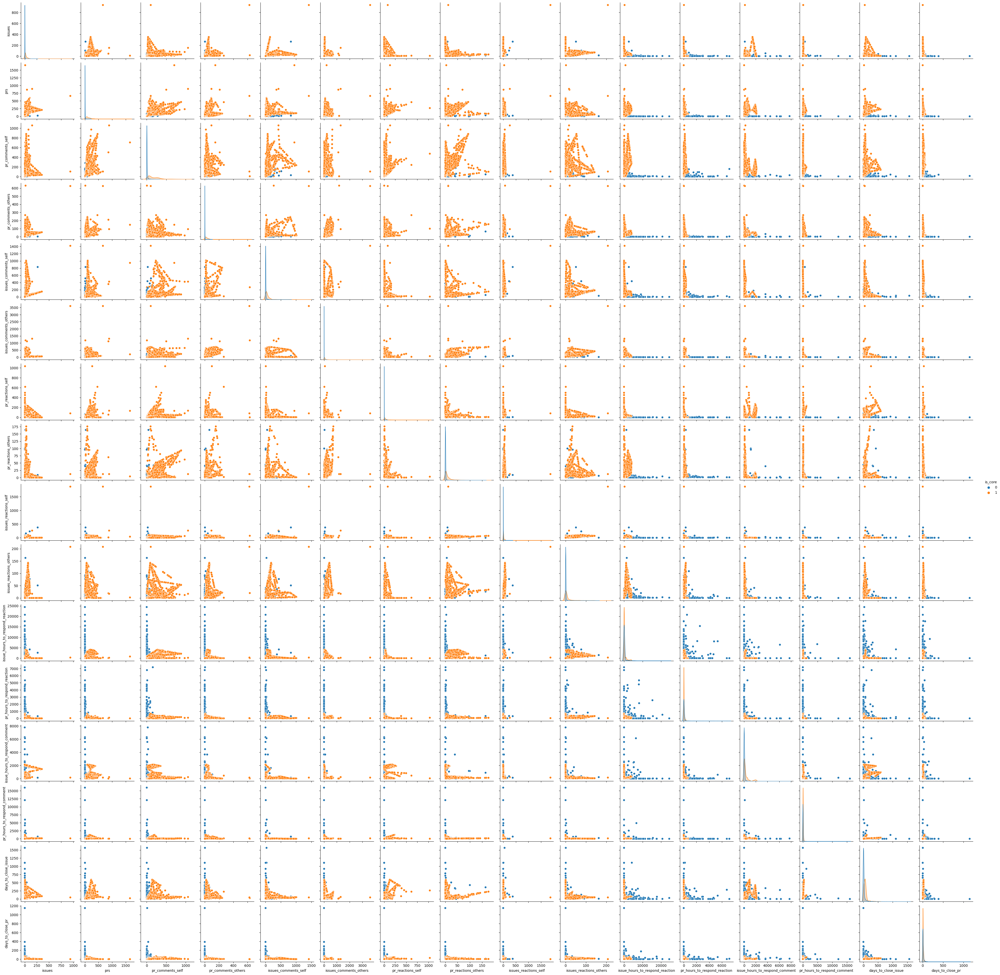

In [7]:
sns.pairplot(c3_train, hue = 'is_core')

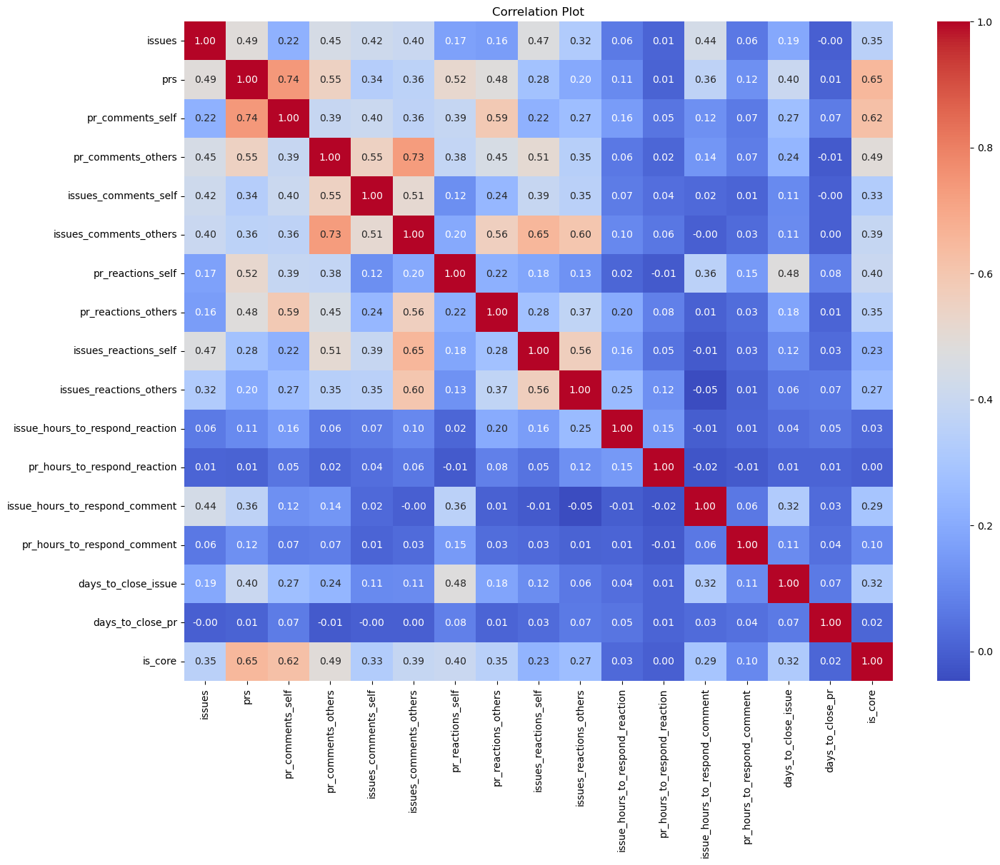

In [8]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(c3_train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [9]:
X = c3_train.drop('is_core', axis=1)
y = c3_train['is_core']

# Calculating mutual information for each feature
mi_scores = mutual_info_classif(X, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.3781
prs: 0.6006
pr_comments_self: 0.5270
pr_comments_others: 0.5204
issues_comments_self: 0.3123
issues_comments_others: 0.4702
pr_reactions_self: 0.4219
pr_reactions_others: 0.2758
issues_reactions_self: 0.2309
issues_reactions_others: 0.1144
issue_hours_to_respond_reaction: 0.2447
pr_hours_to_respond_reaction: 0.3537
issue_hours_to_respond_comment: 0.3570
pr_hours_to_respond_comment: 0.4887
days_to_close_issue: 0.3703
days_to_close_pr: 0.1653


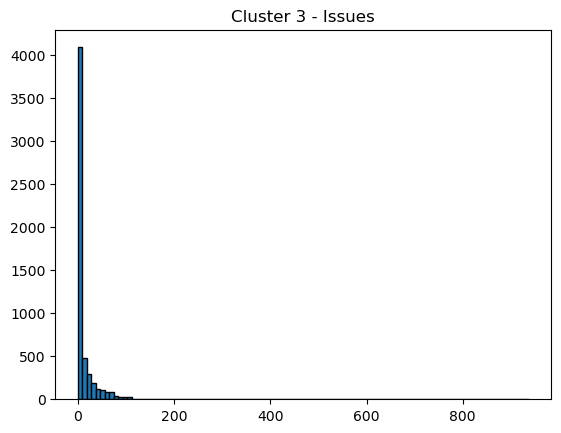

In [10]:
plt.hist(c3_train.issues, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues')
plt.show()

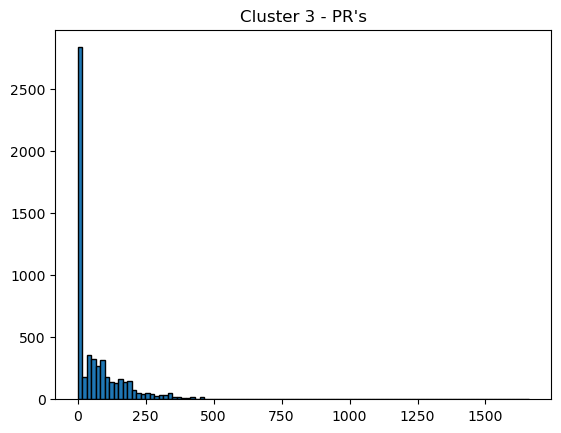

In [11]:
plt.hist(c3_train.prs, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s')
plt.show()

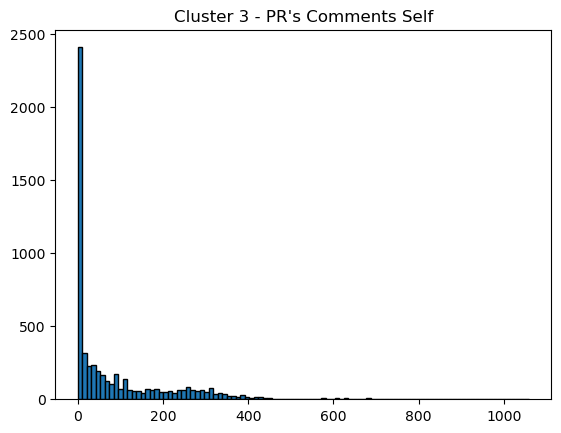

In [12]:
plt.hist(c3_train.pr_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s Comments Self')
plt.show()

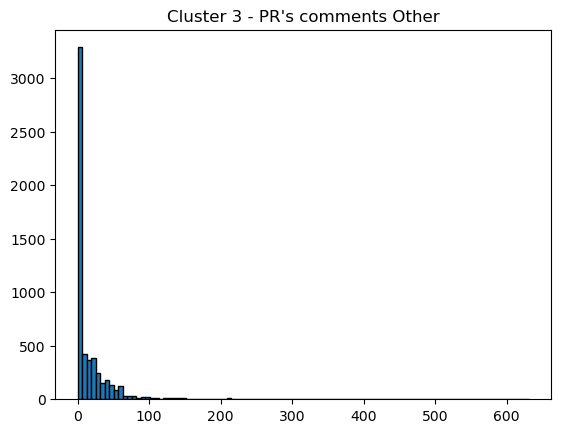

In [13]:
plt.hist(c3_train.pr_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s comments Other')
plt.show()

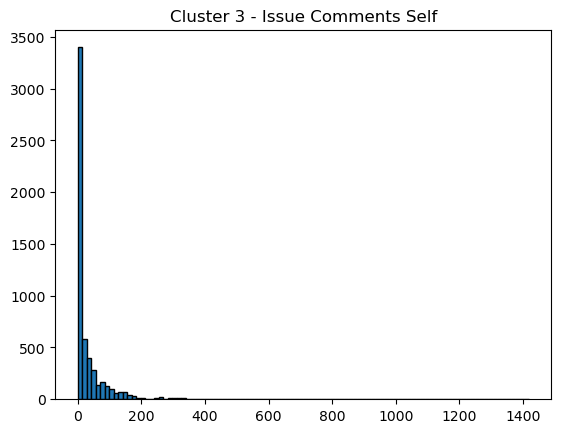

In [14]:
plt.hist(c3_train.issues_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issue Comments Self')
plt.show()

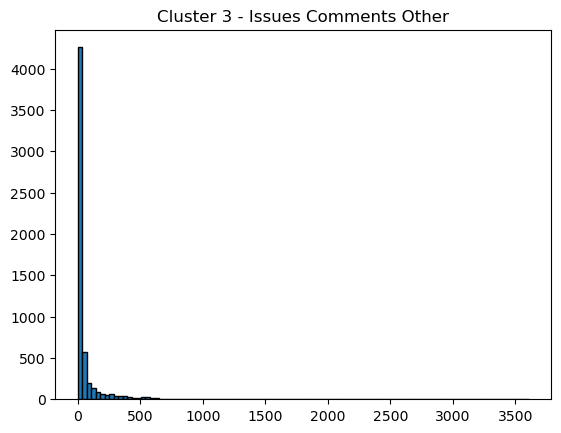

In [15]:
plt.hist(c3_train.issues_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues Comments Other')
plt.show()

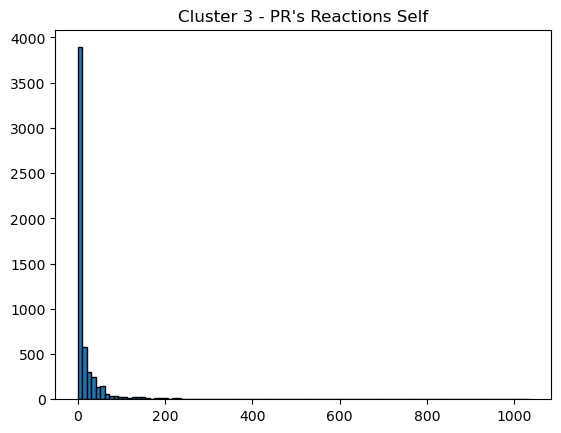

In [16]:
plt.hist(c3_train.pr_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s Reactions Self')
plt.show()

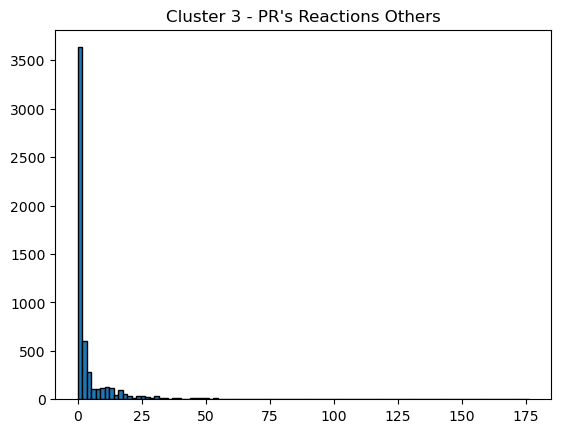

In [17]:
plt.hist(c3_train.pr_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s Reactions Others')
plt.show()

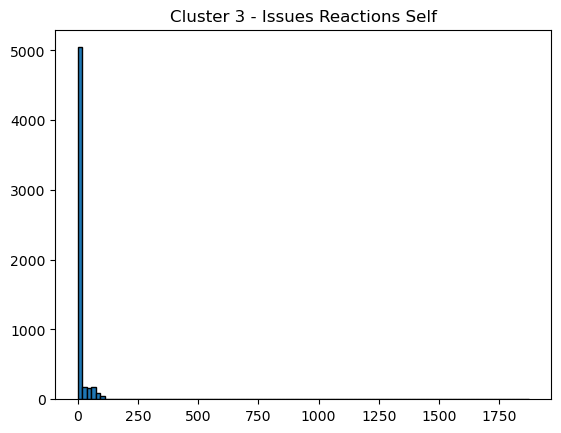

In [18]:
plt.hist(c3_train.issues_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues Reactions Self')
plt.show()

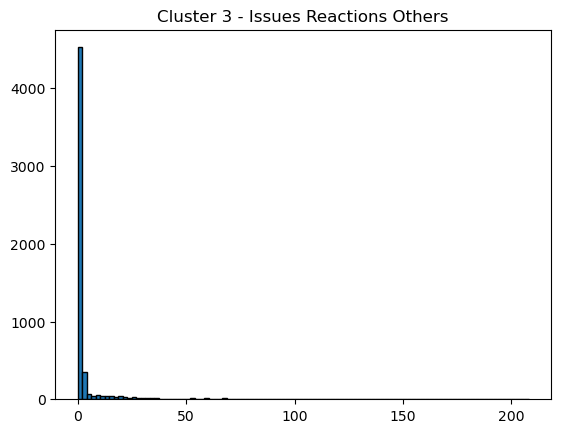

In [19]:
plt.hist(c3_train.issues_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues Reactions Others')
plt.show()

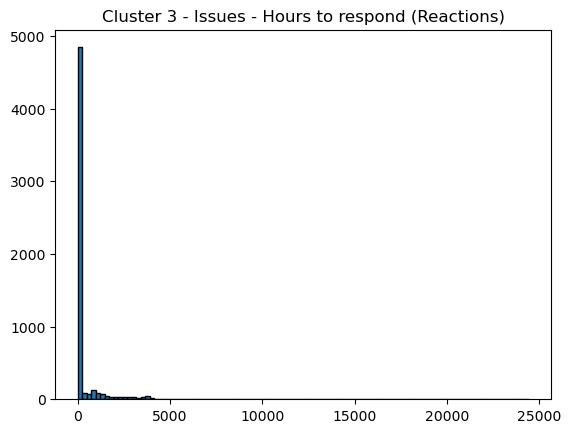

In [20]:
plt.hist(c3_train.issue_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues - Hours to respond (Reactions)')
plt.show()

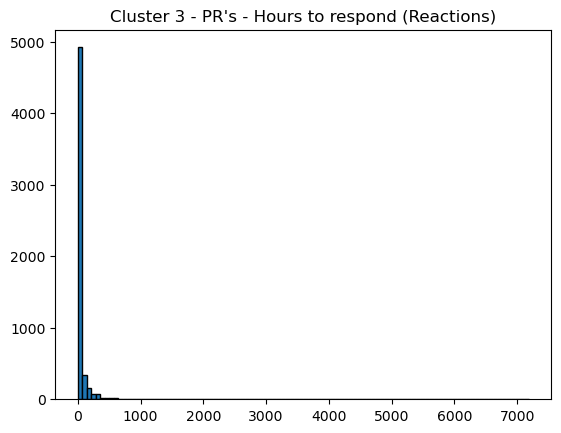

In [21]:
plt.hist(c3_train.pr_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s - Hours to respond (Reactions)')
plt.show()

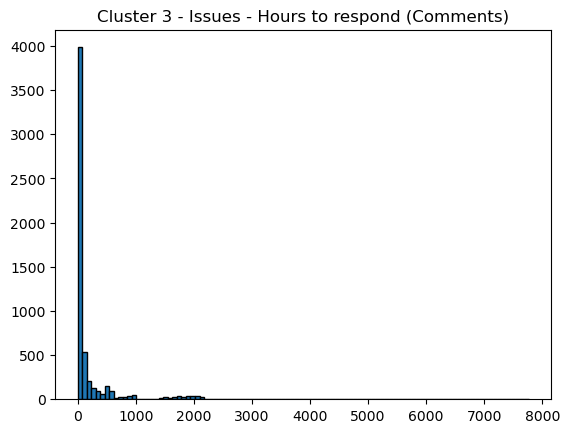

In [22]:
plt.hist(c3_train.issue_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues - Hours to respond (Comments)')
plt.show()

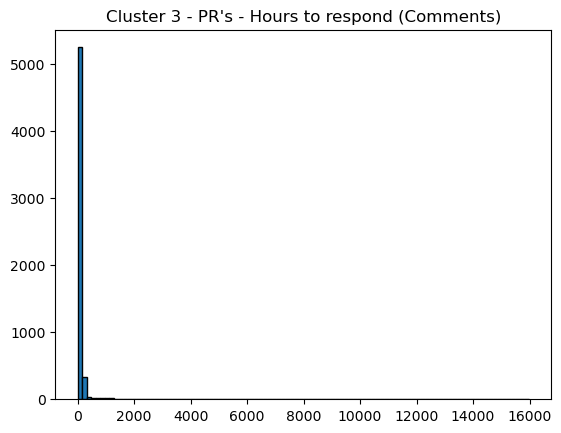

In [23]:
plt.hist(c3_train.pr_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s - Hours to respond (Comments)')
plt.show()

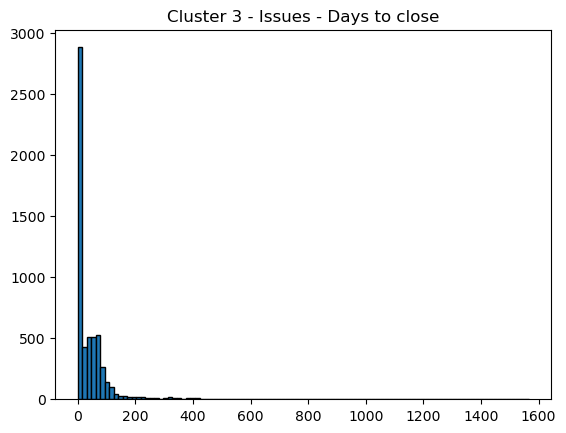

In [24]:
plt.hist(c3_train.days_to_close_issue, bins=100, edgecolor='black')
plt.title('Cluster 3 - Issues - Days to close')
plt.show()

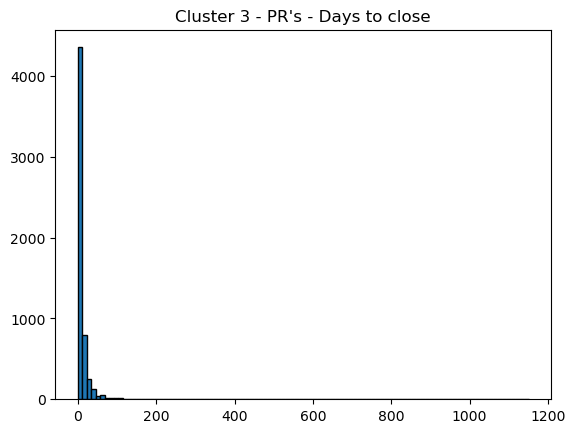

In [25]:
plt.hist(c3_train.days_to_close_pr, bins=100, edgecolor='black')
plt.title('Cluster 3 - PR\'s - Days to close')
plt.show()

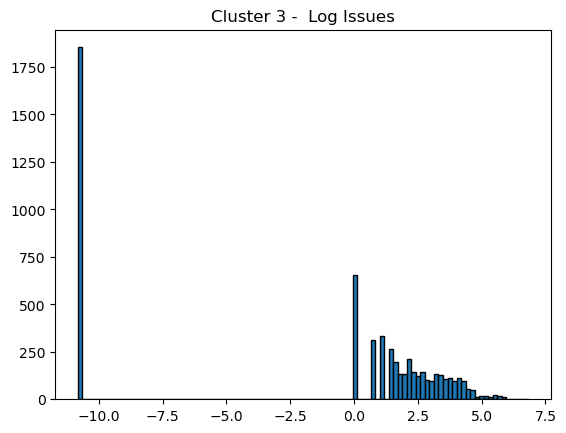

In [26]:
plt.hist(np.log(c3_train.issues + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 -  Log Issues')
plt.show()

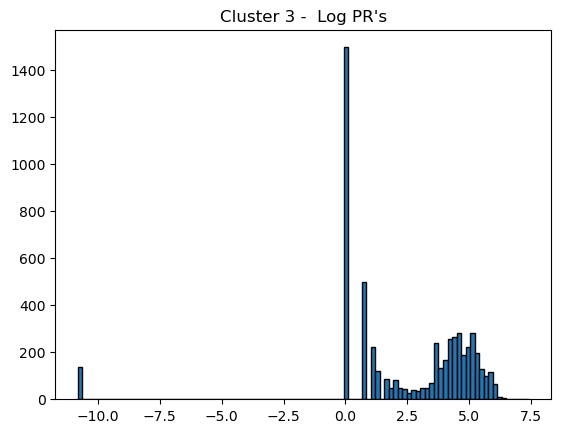

In [27]:
plt.hist(np.log(c3_train.prs + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 -  Log PR\'s')
plt.show()

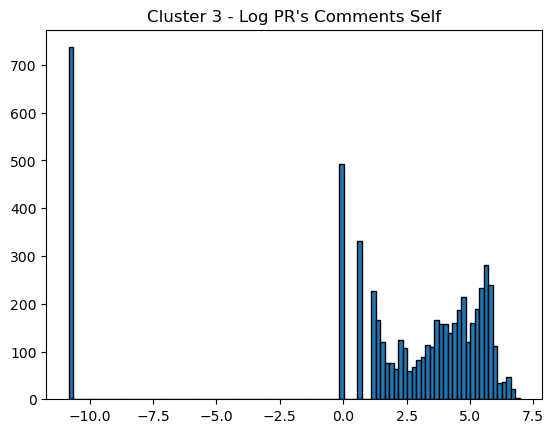

In [28]:
plt.hist(np.log(c3_train.pr_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s Comments Self')
plt.show()

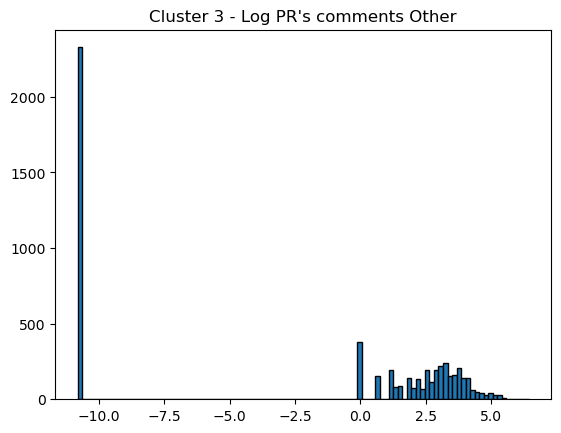

In [29]:
plt.hist(np.log(c3_train.pr_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s comments Other')
plt.show()

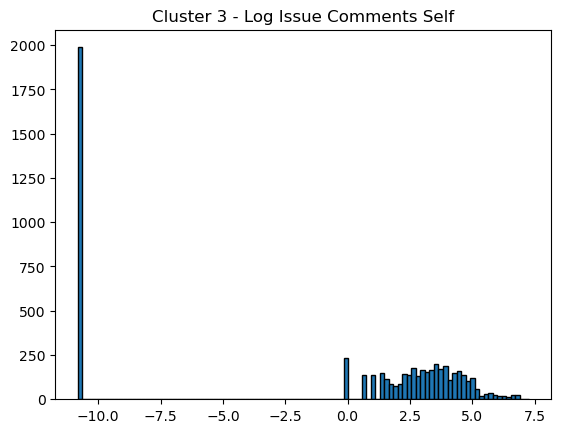

In [30]:
plt.hist(np.log(c3_train.issues_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issue Comments Self')
plt.show()

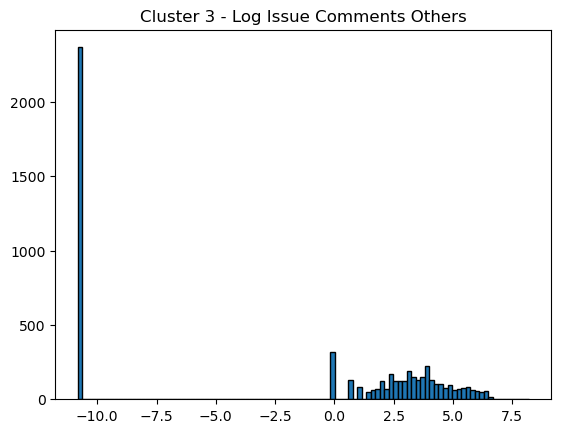

In [31]:
plt.hist(np.log(c3_train.issues_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issue Comments Others')
plt.show()

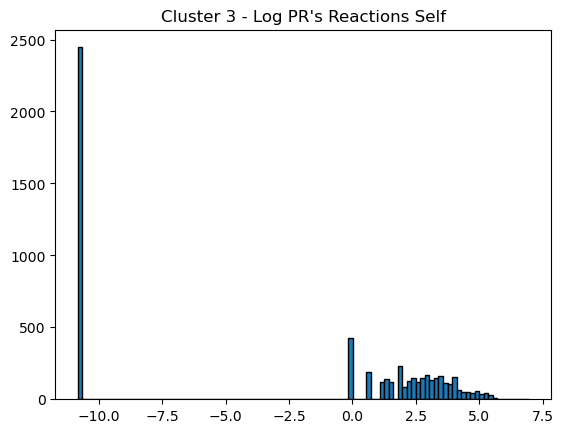

In [32]:
plt.hist(np.log(c3_train.pr_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s Reactions Self')
plt.show()

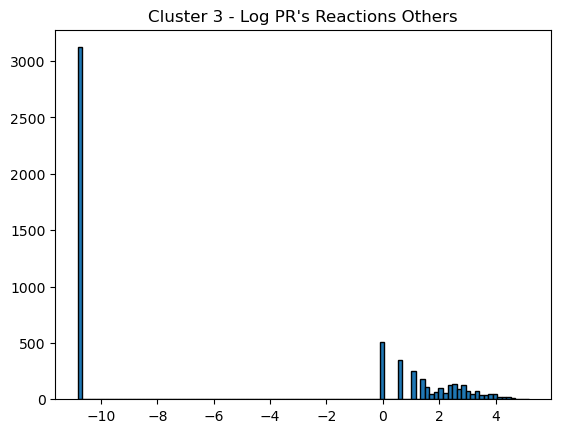

In [33]:
plt.hist(np.log(c3_train.pr_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s Reactions Others')
plt.show()

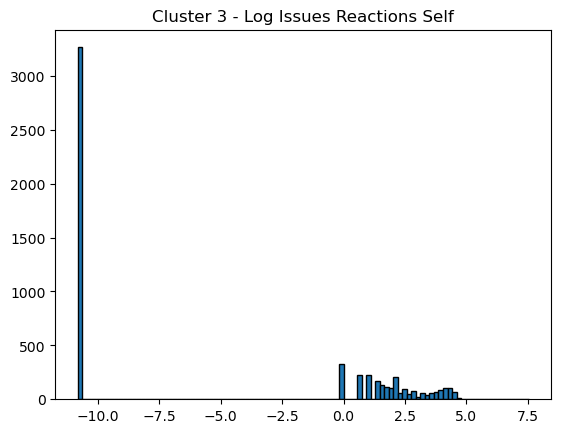

In [34]:
plt.hist(np.log(c3_train.issues_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issues Reactions Self')
plt.show()

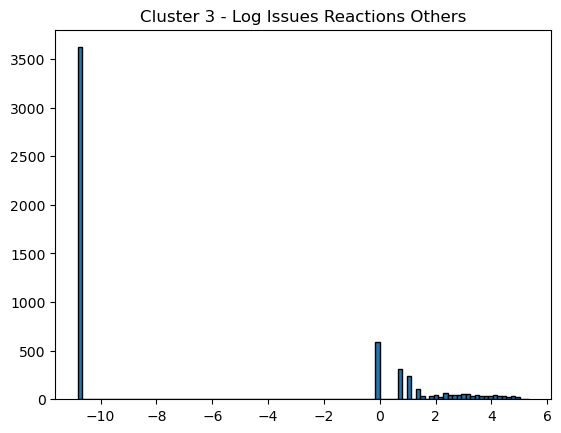

In [35]:
plt.hist(np.log(c3_train.issues_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issues Reactions Others')
plt.show()

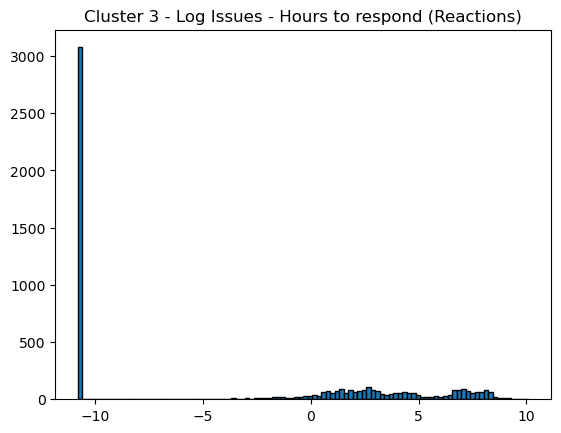

In [36]:
plt.hist(np.log(c3_train.issue_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issues - Hours to respond (Reactions)')
plt.show()

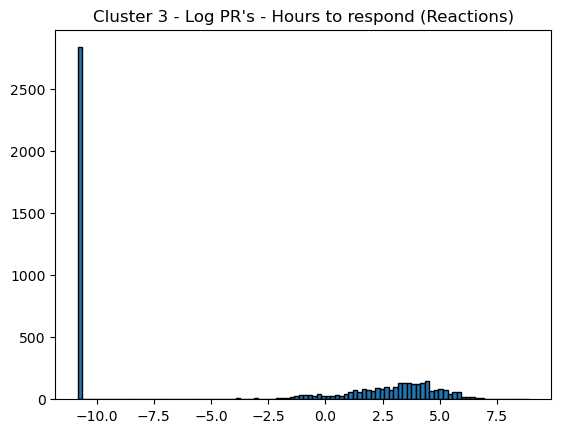

In [37]:
plt.hist(np.log(c3_train.pr_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s - Hours to respond (Reactions)')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


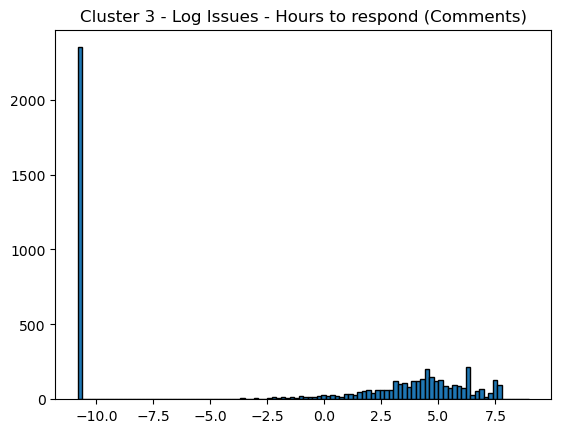

In [38]:
plt.hist(np.log(c3_train.issue_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issues - Hours to respond (Comments)')
plt.show()

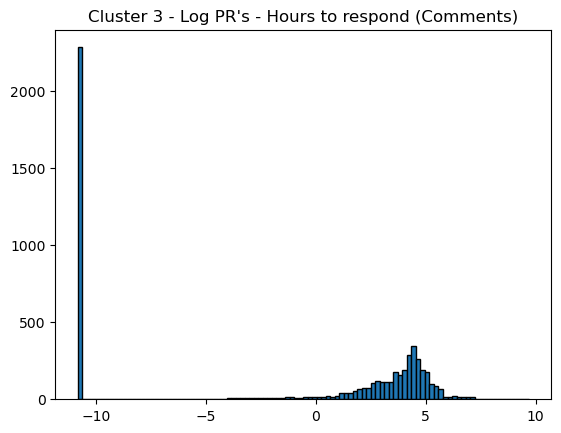

In [39]:
plt.hist(np.log(c3_train.pr_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s - Hours to respond (Comments)')
plt.show()

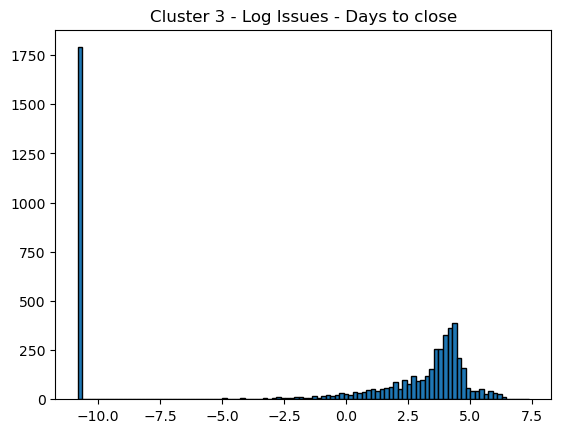

In [40]:
plt.hist(np.log(c3_train.days_to_close_issue + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log Issues - Days to close')
plt.show()

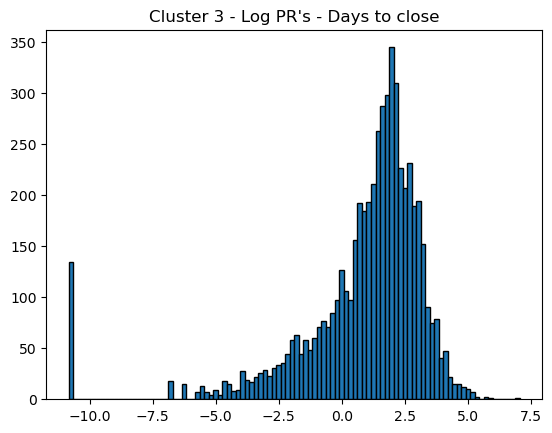

In [41]:
plt.hist(np.log(c3_train.days_to_close_pr + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 3 - Log PR\'s - Days to close')
plt.show()

In [42]:
c3_train.columns

Index(['issues', 'prs', 'pr_comments_self', 'pr_comments_others',
       'issues_comments_self', 'issues_comments_others', 'pr_reactions_self',
       'pr_reactions_others', 'issues_reactions_self',
       'issues_reactions_others', 'issue_hours_to_respond_reaction',
       'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment',
       'pr_hours_to_respond_comment', 'days_to_close_issue',
       'days_to_close_pr', 'is_core'],
      dtype='object')

In [43]:
c3_2 = c3_train.copy()
x = c3_2.drop(columns = 'is_core')
y = c3_2['is_core']


x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

scaler = StandardScaler()
X_std = scaler.fit_transform(x)
train = pd.DataFrame(X_std, columns=x.columns)  # Set the columns explicitly

# Reset index of the original DataFrame
c3_2.reset_index(drop=True, inplace=True)

# Concatenate X_std DataFrame with 'is_core' column
train = pd.concat([train, y], axis=1)
train



,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.350850,-0.786747,-0.299554,-1.186492,0.367158,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,0.209749,-0.656978,0
1,-1.411093,-0.552541,-0.299554,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,1.045774,0.036962,-0.978485,-0.961624,-1.195342,-1.439058,-1.761154,0
2,-1.411093,0.300881,0.417753,-1.186492,-1.341210,0.473240,0.696483,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,0.878174,-1.195342,-1.439058,-0.937251,0
3,-1.411093,-0.786747,-0.299554,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,-0.482681,0
4,-1.411093,-0.415539,-0.163840,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,0.155124,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5687,0.708653,0.964133,0.838826,0.980488,0.693196,0.919183,0.818204,1.277912,1.003455,1.160663,1.025857,1.228764,0.947770,0.920343,0.754007,0.463462,1
5688,0.350850,0.648782,0.789954,0.435262,0.470011,0.820601,0.913667,0.936700,-0.853645,1.045774,0.854941,0.932445,0.843865,0.902076,0.609348,0.350623,1
5689,0.689473,0.942579,0.831684,0.954730,0.693196,0.909592,0.818204,1.277912,1.003455,1.160663,1.066432,1.239741,1.003776,0.907408,0.749285,0.436498,1
5690,0.576598,0.863109,0.804410,0.819714,0.675719,0.871946,0.818204,1.287026,1.003455,1.227870,1.152933,1.272505,1.152774,0.849655,0.731539,0.323595,1


In [44]:
x = X_test.copy()
x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

x2 = x.copy()
x2 = scaler.transform(x2)
test = pd.DataFrame(x2, columns=x.columns)
test = test.reset_index(drop=True)
x = x.reset_index(drop=True)
y_test = y_test.reset_index(drop = True)
test = pd.concat([test, y_test], axis = 1)
test

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,-1.411093,-0.552541,0.015565,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,-1.014065,0
1,-1.411093,-0.786747,-0.299554,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,-0.461996,0
2,0.821528,1.069311,0.793669,1.131396,1.034043,1.358524,1.049426,1.638334,1.477845,1.765767,1.480125,1.326784,0.121647,0.956621,0.513153,-0.261541,1
3,0.576598,-0.552541,-2.418028,-1.186492,0.427323,-1.164183,-1.135661,-0.898931,0.832274,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,0.268321,0.124099,0
4,-1.411093,-0.552541,-0.163840,-1.186492,-1.341210,-1.164183,-1.135661,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,-1.538845,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,-1.411093,-0.786747,-2.418028,-1.186492,-1.341210,-1.164183,0.488401,-0.898931,-0.853645,-0.747632,-0.887096,-0.978485,-0.961624,-1.195342,-1.439058,-0.658863,0
726,0.830332,-0.318334,-0.299554,-1.186492,0.850615,0.728071,-1.135661,-0.898931,1.205906,1.614962,1.605568,-0.978485,0.257131,-1.195342,0.769622,-0.032240,0
727,-1.411093,-0.786747,-0.084452,-1.186492,-1.341210,-1.164183,-1.135661,0.826186,-0.853645,-0.747632,-0.887096,1.611580,-0.961624,-1.195342,-1.439058,0.854998,0
728,-1.411093,-0.786747,0.081444,-1.186492,-1.341210,0.374659,0.488401,0.826186,-0.853645,-0.747632,-0.887096,1.006792,1.567560,-1.195342,-1.439058,1.429213,0


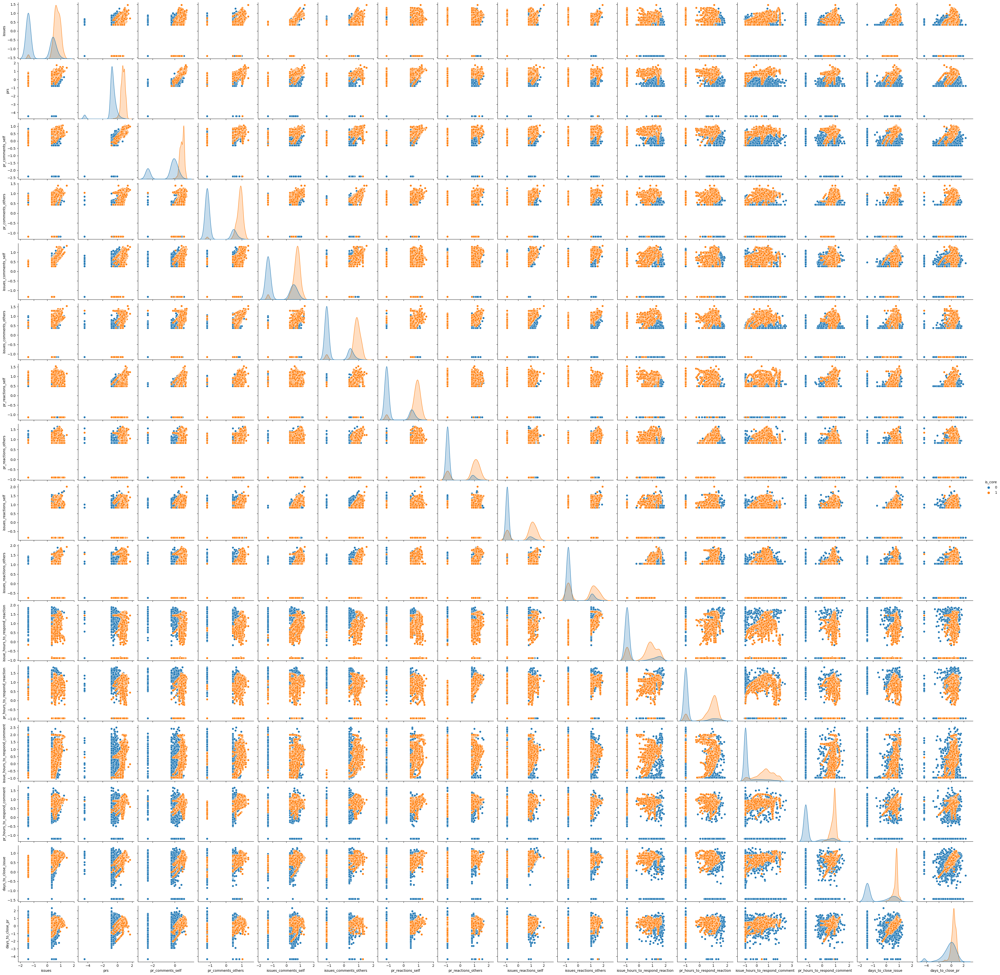

In [45]:
sns.pairplot(train, hue = 'is_core')

In [46]:
# Calculating mutual information for each feature
mi_scores2 = mutual_info_classif(X_std, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores2):
    print(f"{feature}: {score:.4f}")

issues: 0.3736
prs: 0.6018
pr_comments_self: 0.5287
pr_comments_others: 0.5206
issues_comments_self: 0.3036
issues_comments_others: 0.4715
pr_reactions_self: 0.4220
pr_reactions_others: 0.2718
issues_reactions_self: 0.2339
issues_reactions_others: 0.1201
issue_hours_to_respond_reaction: 0.2452
pr_hours_to_respond_reaction: 0.3564
issue_hours_to_respond_comment: 0.3586
pr_hours_to_respond_comment: 0.4895
days_to_close_issue: 0.3710
days_to_close_pr: 0.1659


In [47]:
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.3781
prs: 0.6006
pr_comments_self: 0.5270
pr_comments_others: 0.5204
issues_comments_self: 0.3123
issues_comments_others: 0.4702
pr_reactions_self: 0.4219
pr_reactions_others: 0.2758
issues_reactions_self: 0.2309
issues_reactions_others: 0.1144
issue_hours_to_respond_reaction: 0.2447
pr_hours_to_respond_reaction: 0.3537
issue_hours_to_respond_comment: 0.3570
pr_hours_to_respond_comment: 0.4887
days_to_close_issue: 0.3703
days_to_close_pr: 0.1653


In [48]:
for i in range(len(mi_scores)):
    print(X.columns[i], ":", round(mi_scores2[i] - mi_scores[i], 4))

issues : -0.0044
prs : 0.0011
pr_comments_self : 0.0017
pr_comments_others : 0.0002
issues_comments_self : -0.0087
issues_comments_others : 0.0014
pr_reactions_self : 0.0001
pr_reactions_others : -0.004
issues_reactions_self : 0.0031
issues_reactions_others : 0.0057
issue_hours_to_respond_reaction : 0.0005
pr_hours_to_respond_reaction : 0.0027
issue_hours_to_respond_comment : 0.0015
pr_hours_to_respond_comment : 0.0008
days_to_close_issue : 0.0006
days_to_close_pr : 0.0006


In [49]:
sorted_data = [x for _, x in sorted(zip(mi_scores2, X.columns), reverse=True)]
sorted_values = sorted(mi_scores2, reverse=True)

Text(0.5, 1.0, 'Mutual Information of Features')

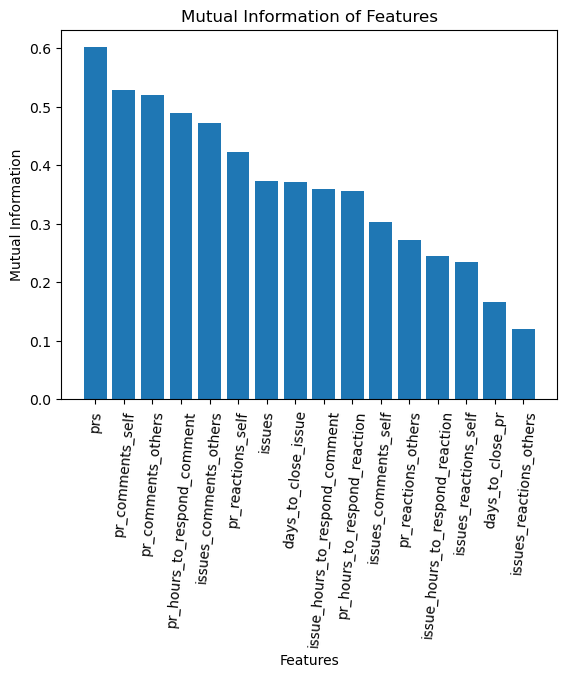

In [50]:
plt.bar(sorted_data, sorted_values)
plt.xticks(rotation=85) 
plt.xlabel('Features')
plt.ylabel('Mutual Information')
plt.title('Mutual Information of Features')

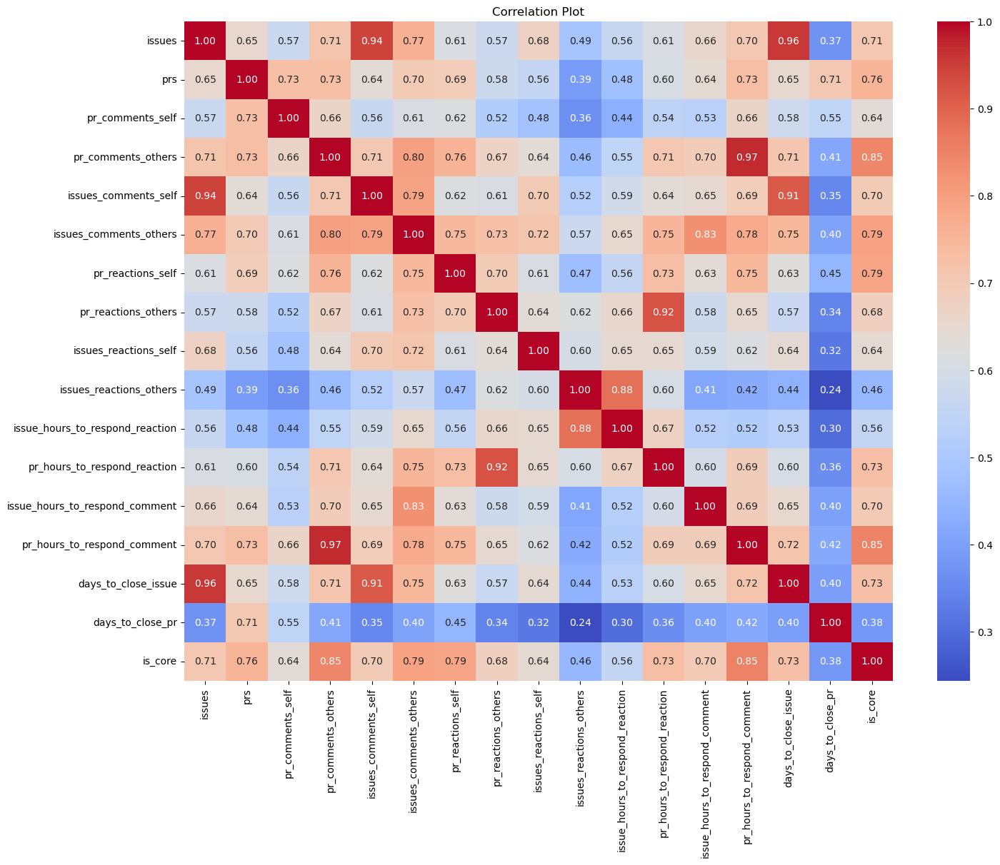

In [51]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [52]:
test['is_core'] = pd.Categorical(test['is_core'])
test['is_core'] = pd.Categorical(test['is_core'])

X_train = train.drop(columns = "is_core")
X_test = test.drop(columns = 'is_core')

y_train = train['is_core']
y_test = test['is_core']

X_train_filter = X_train.copy()
X_test_filter = X_test.copy()

X_train_filter = X_train_filter.drop(columns = ['issues', 'issues_comments_self', 'issues_comments_others', 
                                                'pr_hours_to_respond_comment', 'pr_reactions_others', 'issues_reactions_others',
                                               'issue_hours_to_respond_comment', 'days_to_close_pr'])

X_test_filter = X_test_filter.drop(columns = ['issues', 'issues_comments_self', 'issues_comments_others', 
                                                'pr_hours_to_respond_comment', 'pr_reactions_others', 'issues_reactions_others',
                                               'issue_hours_to_respond_comment', 'days_to_close_pr'])

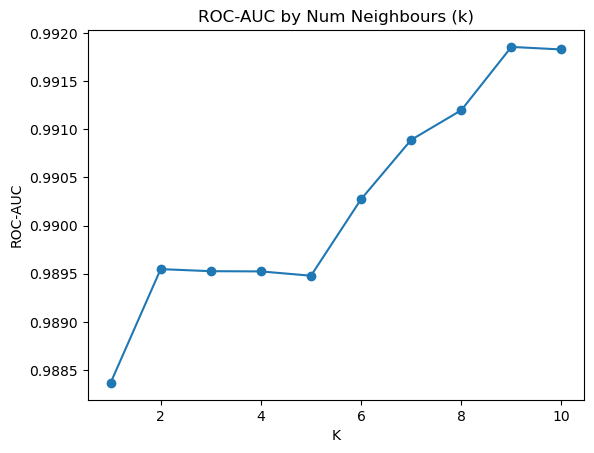

In [53]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [54]:
max_k = scores.index(max(scores))+1
knn_classifier_final = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_final.fit(X_train, y_train)


y_pred = knn_classifier_final.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[693  25]
 [  2  10]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       718
           1       0.29      0.83      0.43        12

    accuracy                           0.96       730
   macro avg       0.64      0.90      0.70       730
weighted avg       0.99      0.96      0.97       730



In [55]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model = rf_grid_search.best_estimator_
y_pred = rf_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.6 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[703  15]
 [  2  10]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       718
           1       0.40      0.83      0.54        12

    accuracy                           0.98       730
   macro avg       0.70      0.91      0.76       730
weighted avg       0.99      0.98      0.98       730



In [56]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model = dt_grid_search.best_estimator_
y_pred = dt_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.02 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 3}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[701  17]
 [  2  10]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       718
           1       0.37      0.83      0.51        12

    accuracy                           0.97       730
   macro avg       0.68      0.90      0.75       730
weighted avg       0.99      0.97      0.98       730



In [57]:
y_pred = dt_best_model.predict(X_train)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[2796   50]
 [  38 2808]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2846
           1       0.98      0.99      0.98      2846

    accuracy                           0.98      5692
   macro avg       0.98      0.98      0.98      5692
weighted avg       0.98      0.98      0.98      5692



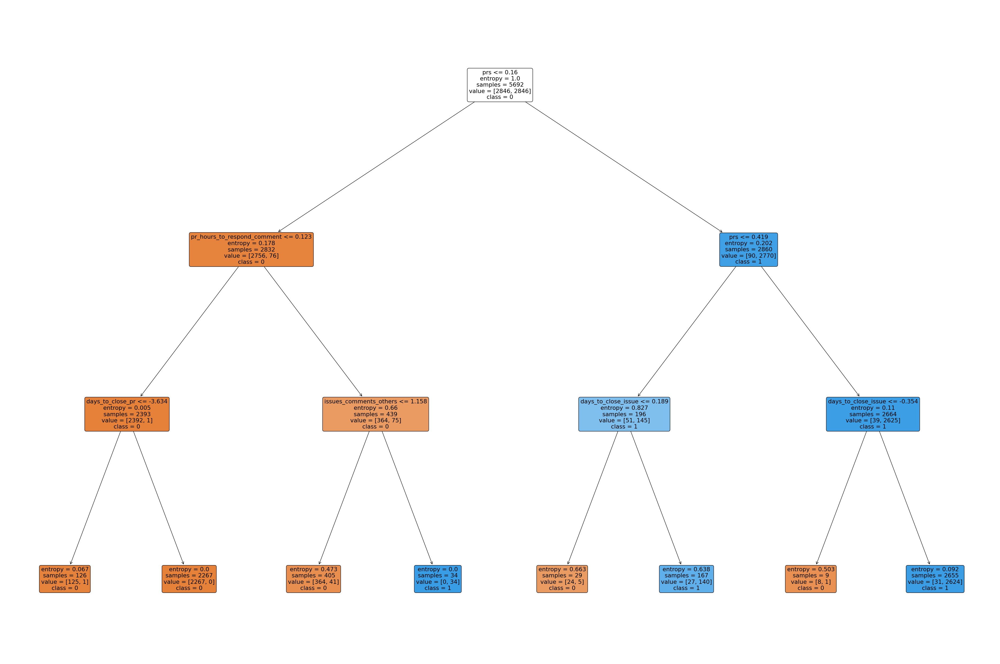

In [58]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [59]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model = xg_grid_search.best_estimator_
y_pred = xg_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 6.17 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[705  13]
 [  3   9]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       718
           1       0.41      0.75      0.53        12

    accuracy                           0.98       730
   macro avg       0.70      0.87      0.76       730
weighted avg       0.99      0.98      0.98       730



In [60]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.03 Minutes



C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


In [61]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model = log_grid_search.best_estimator_
y_pred = log_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0.1, 'penalty': 'l1'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[678  40]
 [  0  12]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       718
           1       0.23      1.00      0.38        12

    accuracy                           0.95       730
   macro avg       0.62      0.97      0.67       730
weighted avg       0.99      0.95      0.96       730



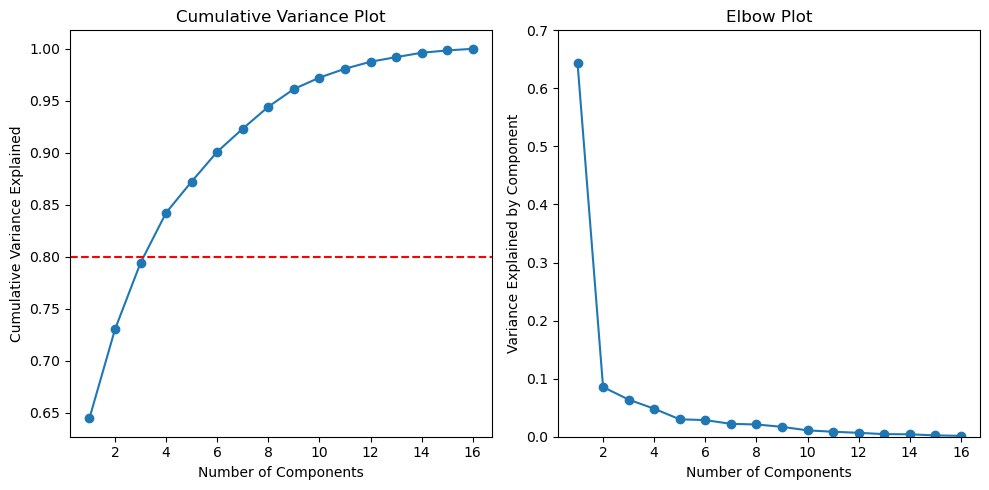

In [62]:
# Fit PCA and transform the standardized data
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

# Elbow plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.title('Cumulative Variance Plot')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.axhline(y=0.8, color='red', linestyle='--')

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Elbow Plot')
plt.xlabel('Number of Components')
plt.ylabel('Variance Explained by Component')
plt.ylim(0, 0.7)  
plt.tight_layout()

plt.show()

In [63]:
pca = PCA(n_components=4)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

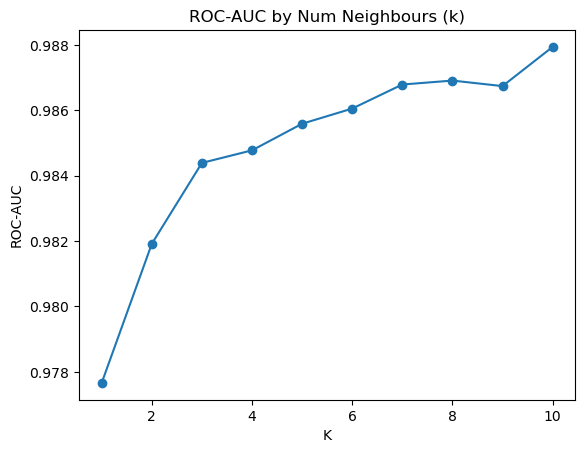

In [64]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_pca, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))

plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()    

In [65]:
max_k = scores.index(max(scores))+1
knn_classifier_pca = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_pca.fit(X_train_pca, y_train)


y_pred = knn_classifier_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[687  31]
 [  1  11]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       718
           1       0.26      0.92      0.41        12

    accuracy                           0.96       730
   macro avg       0.63      0.94      0.69       730
weighted avg       0.99      0.96      0.97       730



In [68]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_pca = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_pca = rf_grid_search_pca.best_estimator_
y_pred = rf_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.72 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[694  24]
 [  2  10]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       718
           1       0.29      0.83      0.43        12

    accuracy                           0.96       730
   macro avg       0.65      0.90      0.71       730
weighted avg       0.99      0.96      0.97       730



In [69]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_pca = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_pca = dt_grid_search_pca.best_estimator_
y_pred = dt_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.01 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 3}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[689  29]
 [  2  10]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       718
           1       0.26      0.83      0.39        12

    accuracy                           0.96       730
   macro avg       0.63      0.90      0.69       730
weighted avg       0.98      0.96      0.97       730



In [70]:
y_pred = dt_best_model_pca.predict(X_train_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[2767   79]
 [  95 2751]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      2846
           1       0.97      0.97      0.97      2846

    accuracy                           0.97      5692
   macro avg       0.97      0.97      0.97      5692
weighted avg       0.97      0.97      0.97      5692



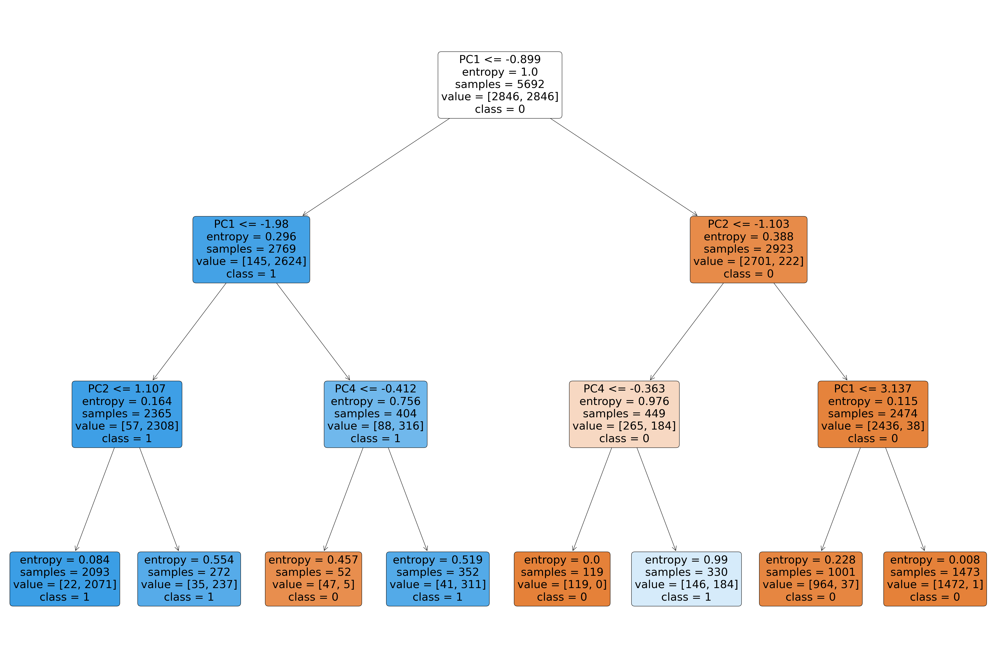

In [71]:
cols = ['PC1', 'PC2', 'PC3', 'PC4']
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_pca, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = cols, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [73]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_pca = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = 8)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_pca = xg_grid_search_pca.best_estimator_
y_pred = xg_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 8.38 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[696  22]
 [  2  10]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       718
           1       0.31      0.83      0.45        12

    accuracy                           0.97       730
   macro avg       0.65      0.90      0.72       730
weighted avg       0.99      0.97      0.97       730



In [74]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_pca = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.07 Minutes



In [75]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_pca = log_grid_search_pca.best_estimator_
y_pred = log_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0.1, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[660  58]
 [  0  12]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       718
           1       0.17      1.00      0.29        12

    accuracy                           0.92       730
   macro avg       0.59      0.96      0.63       730
weighted avg       0.99      0.92      0.95       730



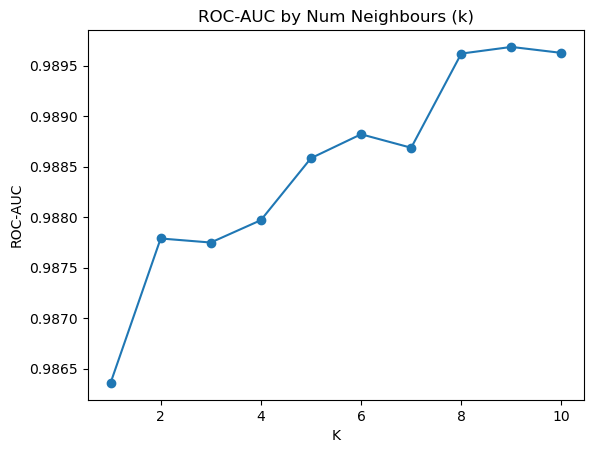

In [76]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_filter, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [77]:
max_k = scores.index(max(scores))+1
knn_classifier_filter = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_filter.fit(X_train_filter, y_train)


y_pred = knn_classifier_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[691  27]
 [  2  10]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       718
           1       0.27      0.83      0.41        12

    accuracy                           0.96       730
   macro avg       0.63      0.90      0.69       730
weighted avg       0.99      0.96      0.97       730



In [78]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_filter = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_filter = rf_grid_search_filter.best_estimator_
y_pred = rf_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.07 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[702  16]
 [  2  10]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       718
           1       0.38      0.83      0.53        12

    accuracy                           0.98       730
   macro avg       0.69      0.91      0.76       730
weighted avg       0.99      0.98      0.98       730



In [79]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_filter = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_filter = dt_grid_search_filter.best_estimator_
y_pred = dt_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.01 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 3}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[700  18]
 [  2  10]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.99       718
           1       0.36      0.83      0.50        12

    accuracy                           0.97       730
   macro avg       0.68      0.90      0.74       730
weighted avg       0.99      0.97      0.98       730



In [80]:
y_pred = dt_best_model_filter.predict(X_train_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[2785   61]
 [  49 2797]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2846
           1       0.98      0.98      0.98      2846

    accuracy                           0.98      5692
   macro avg       0.98      0.98      0.98      5692
weighted avg       0.98      0.98      0.98      5692



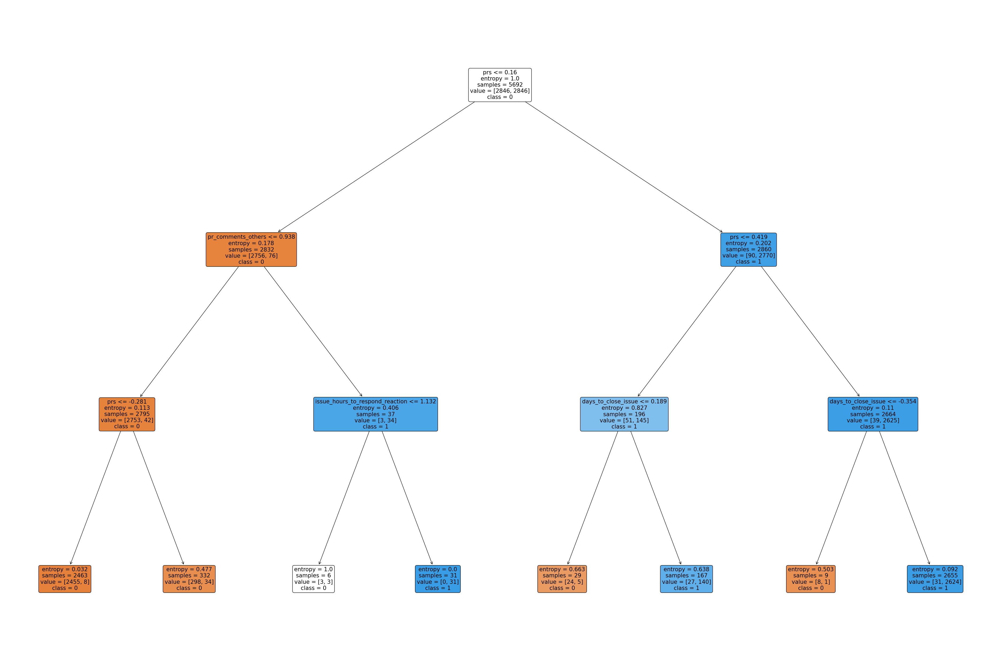

In [81]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_filter, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train_filter.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [82]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_filter = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_filter = xg_grid_search_filter.best_estimator_
y_pred = xg_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 3.27 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[702  16]
 [  4   8]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       718
           1       0.33      0.67      0.44        12

    accuracy                           0.97       730
   macro avg       0.66      0.82      0.72       730
weighted avg       0.98      0.97      0.98       730



In [83]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_filter = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



In [84]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_filter = log_grid_search_filter.best_estimator_
y_pred = log_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.1, 'l1_ratio': 0.5, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[684  34]
 [  0  12]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.98       718
           1       0.26      1.00      0.41        12

    accuracy                           0.95       730
   macro avg       0.63      0.98      0.69       730
weighted avg       0.99      0.95      0.97       730



In [85]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_filter = log_grid_search_filter.best_estimator_
y_pred = log_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

test_matrix = classification_report(y_test, y_pred)

Best Hyperparameters: {'C': 0.1, 'l1_ratio': 0.5, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[684  34]
 [  0  12]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.98       718
           1       0.26      1.00      0.41        12

    accuracy                           0.95       730
   macro avg       0.63      0.98      0.69       730
weighted avg       0.99      0.95      0.97       730



In [86]:
std_models = [knn_classifier_final, rf_best_model, dt_best_model, xg_best_model, log_best_model]
pca_models = [knn_classifier_pca, rf_best_model_pca, dt_best_model_pca, xg_best_model_pca, log_best_model_pca]
filter_models = [knn_classifier_filter, rf_best_model_filter, dt_best_model_filter, xg_best_model_filter, log_best_model_filter]

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


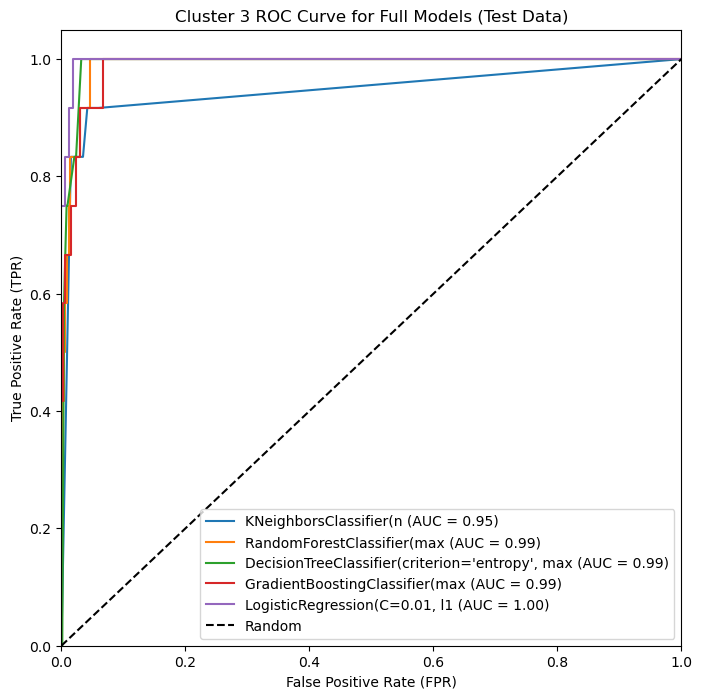

In [87]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 3 ROC Curve for Full Models (Test Data)')
plt.legend(loc='lower right')

plt.show()


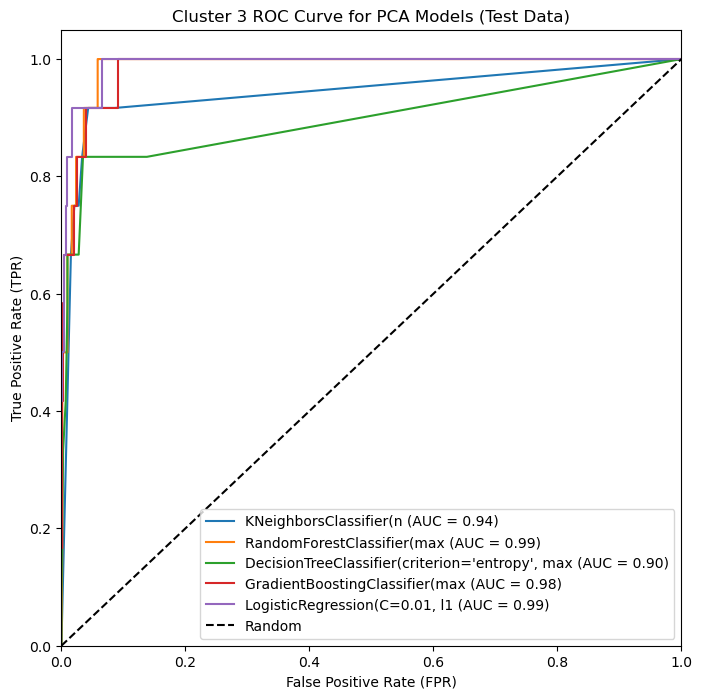

In [88]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 3 ROC Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

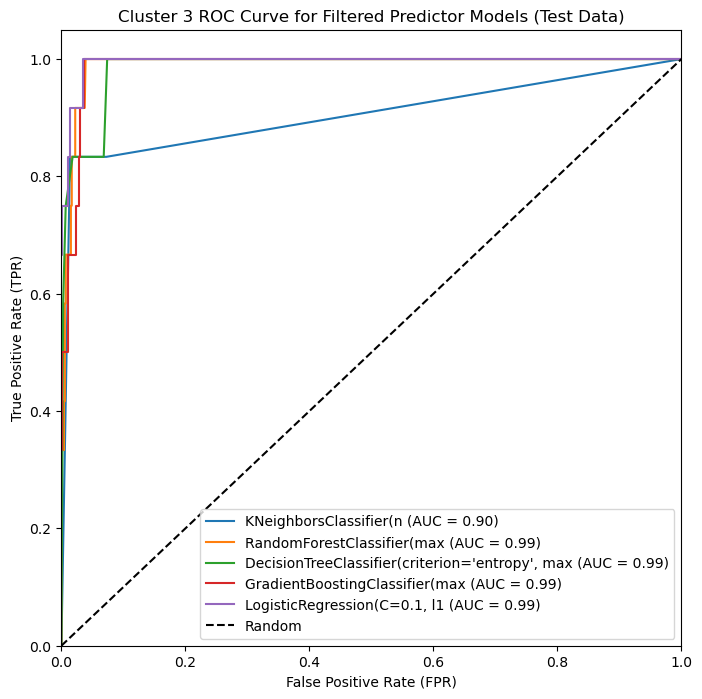

In [89]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 3 ROC Curve for Filtered Predictor Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


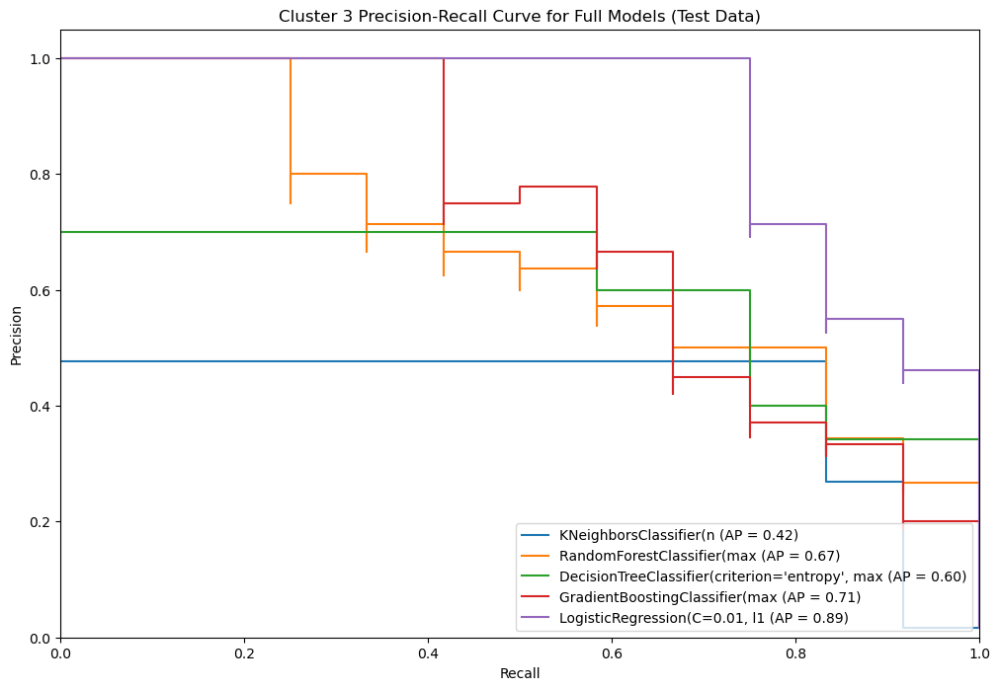

In [90]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 3 Precision-Recall Curve for Full Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

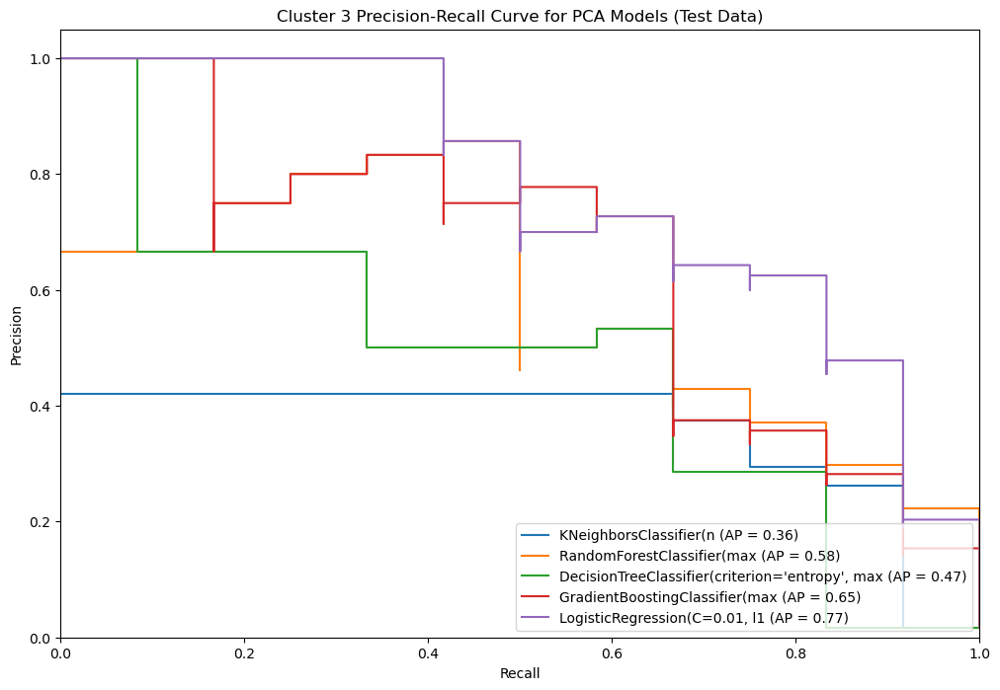

In [91]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 3 Precision-Recall Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

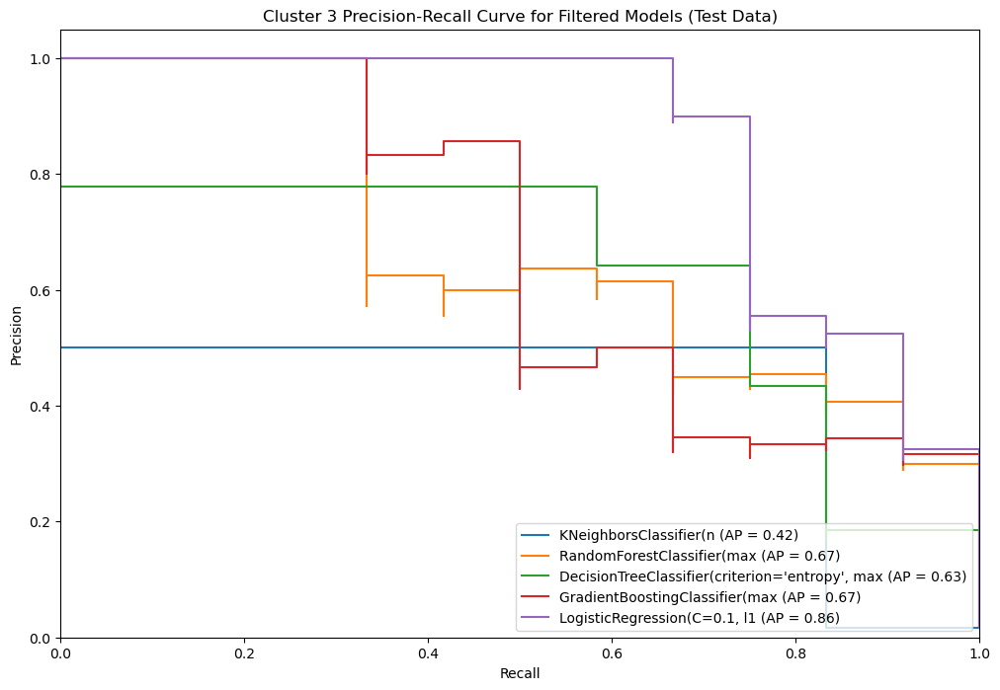

In [92]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')
    #plt.scatter(recall, precision, marker='o', color='black', s=20)

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 3 Precision-Recall Curve for Filtered Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


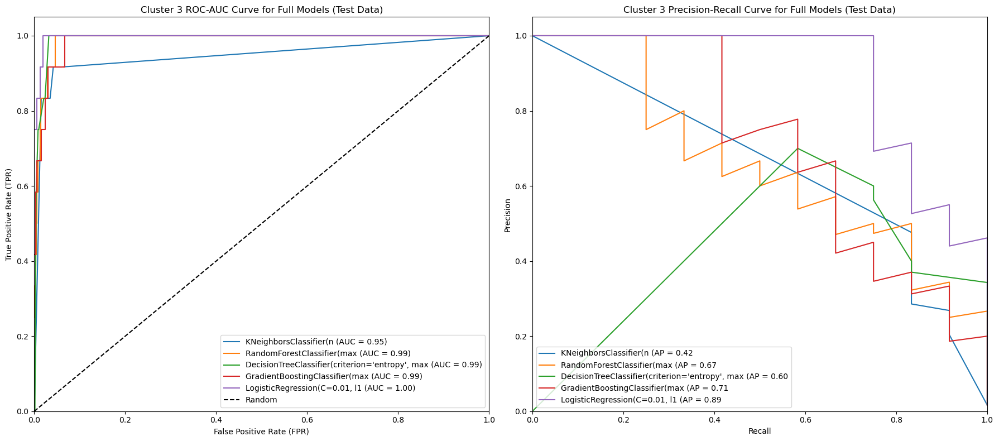

In [95]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 3 ROC-AUC Curve for Full Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 3 Precision-Recall Curve for Full Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

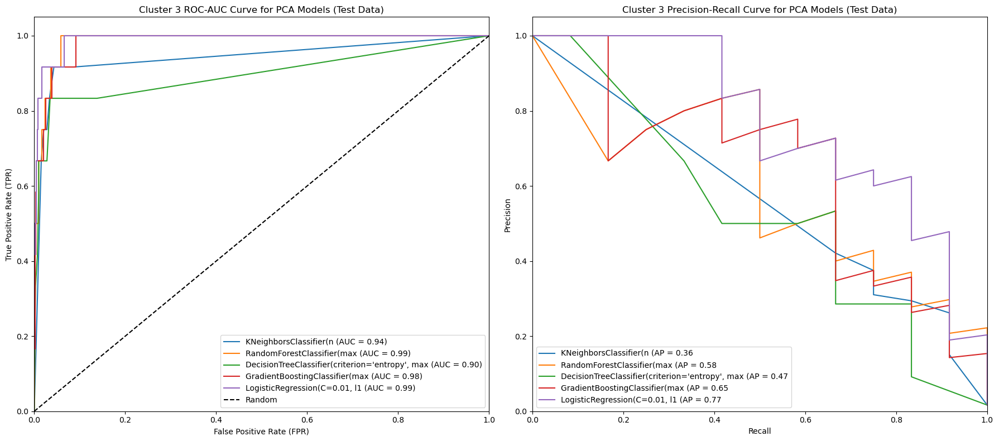

In [96]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 3 ROC-AUC Curve for PCA Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 3 Precision-Recall Curve for PCA Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


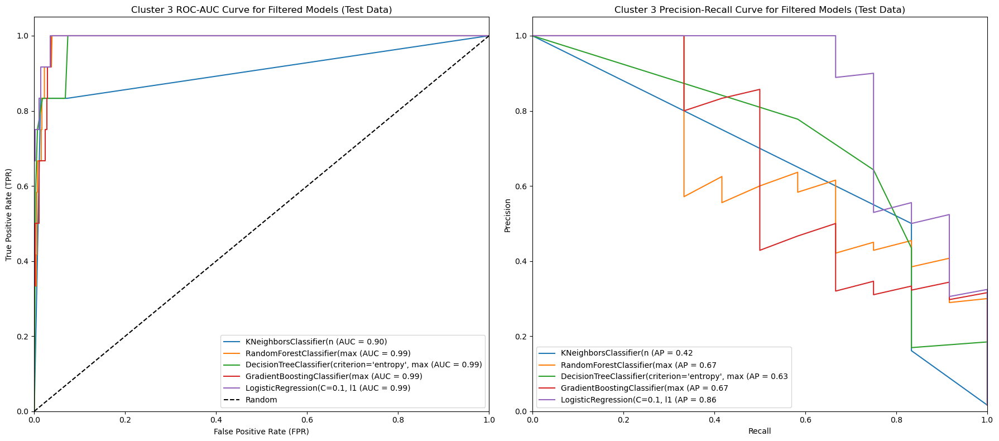

In [97]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 3 ROC-AUC Curve for Filtered Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 3 Precision-Recall Curve for Filtered Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()
